# Vehicle Detection and Tracking
**In this project, I built a software pipeline to detect vehicles in a video.**

## Pipeline architecture:
- **Data Loading and Visualization.**
- **Features Extraction**.
- **Classification Model.**
- **Vehicle Detection.**
- **Advanced Vehicle Detection.**
- **Video Processing.**

I'll explain each step in details below.

#### Environement:
-  Ubuntu 16.04
-  Anaconda 5.0.1
-  Python 3.6.2
-  OpenCV 3.1.0

In [1]:
# Importing Python libraries

from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import pickle
import cv2
import glob
import time
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML

%matplotlib inline

In [51]:
def display(images, labels, x=14, y=7, n=1, cmap=None):
    """
    Display the input images side-by-side.
        Parameters:
            images: List of images to be displayed.
            labels: List of labels.
            x, y (Default = 14 x 7): Figure size.
            n (Default = 1) = Number of images to be displayed.
            cmap (Default = None): Used to display gray images.
    """
    if n == 1:
        plt.imshow(images, cmap = cmap)
        plt.xlabel(labels, fontsize=12)
        plt.xticks([])
        plt.yticks([])
    else:
        count = 1
        plt.figure(figsize=(x, y))
        for img, lbl in zip(images, labels):
            plt.subplot(1, n, count)
            plt.imshow(img, cmap = cmap)
            plt.xlabel(lbl, fontsize=12)
            plt.xticks([])
            plt.yticks([])
            count += 1
    plt.show()

---
## Step 1: Data Loading and Visualization

You can download the `vehicles` dataset from [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/vehicles.zip) and the `non_vehicles` dataset from [here](https://s3.amazonaws.com/udacity-sdc/Vehicle_Tracking/non-vehicles.zip)

These example images come from a combination of the [GTI vehicle image database](http://www.gti.ssr.upm.es/data/Vehicle_database.html), the [KITTI vision benchmark suite](http://www.cvlibs.net/datasets/kitti/), and examples extracted from the project video itself.

In [3]:
# Read in cars and notcars
cars = []
notcars = []
test_images = []

for file in glob.glob('training_set/vehicles/**/*.png'):
    cars.append(file)
for file in glob.glob('training_set/non-vehicles/**/*.png'):
    notcars.append(file)

for image_f in glob.glob('test_images/test*.jpg'):
    test_images.append(image_f)
    
print("Vehicle Images:    ", len(cars))
print("Non-Vehicle Images:", len(notcars))

Vehicle Images:     8792
Non-Vehicle Images: 8968


Vehicle examples:


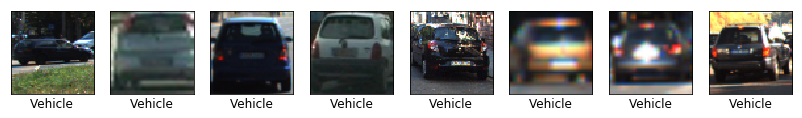

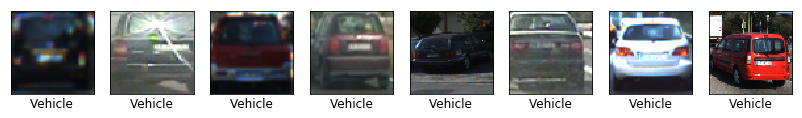

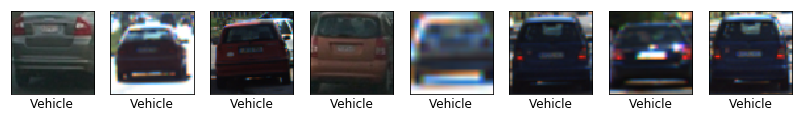

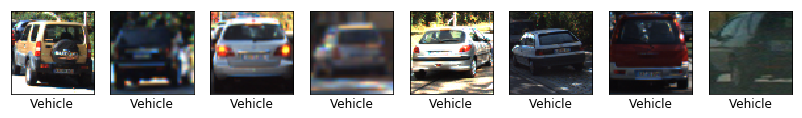

Non-Vehicle examples:


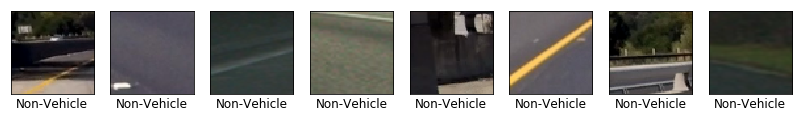

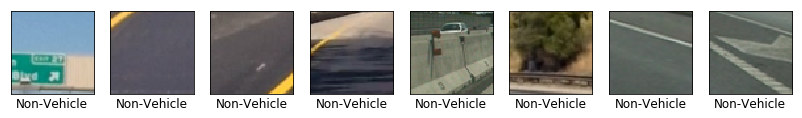

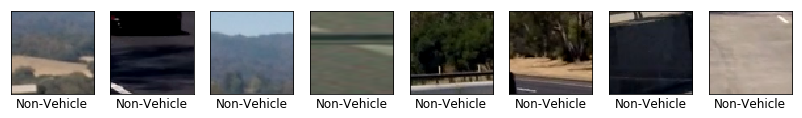

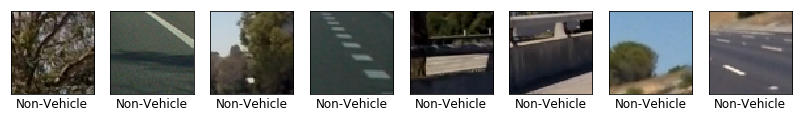

In [4]:
vehicle_examples = []
vehicle_labels = []
nonvehicle_examples = []
nonvehicle_labels = []

    
for i in np.arange(32):
    vehicle_examples.append(cv2.cvtColor(cv2.imread(cars[np.random.randint(0, len(cars))]), cv2.COLOR_BGR2RGB))
    vehicle_labels.append("Vehicle")
    nonvehicle_examples.append(cv2.cvtColor(cv2.imread(notcars[np.random.randint(0, len(notcars))]), cv2.COLOR_BGR2RGB))
    nonvehicle_labels.append("Non-Vehicle")

print("Vehicle examples:")
x = 0
y = 8
while(x != 32):
    display(vehicle_examples[x:y], vehicle_labels, 14, 7, 8)
    y += 8
    x += 8

print("Non-Vehicle examples:")
x = 0
y = 8
while(x != 32):
    display(nonvehicle_examples[x:y], nonvehicle_labels, 14, 7, 8)
    y += 8
    x += 8

---
## Step 2: Features Extraction

After loading the training set in the previous step, we will now extract the images' features. We'll extract three types of features:
- [Histogram of Oriented Gradients (HOG)](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients): Shape features.
- Binned color: Color and shape features.
- Color histogram features: Color only features.

In [5]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    """
    Extract the HOG features from the input image.
        Parameters:
            img: Input image.
            orient: Number of orientation bins.
            pix_per_cell: Size (in pixels) of a cell.
            cell_per_block: Number of cells in each block.
            vis: Visualization flag.
            feature_vec: Return the data as a feature vector.
    """
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    else:
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

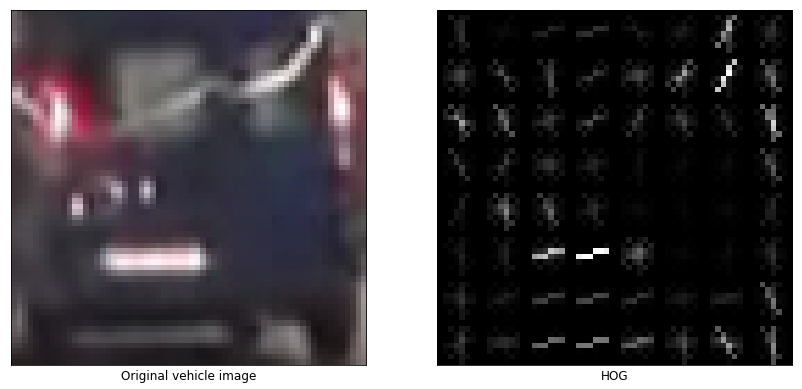

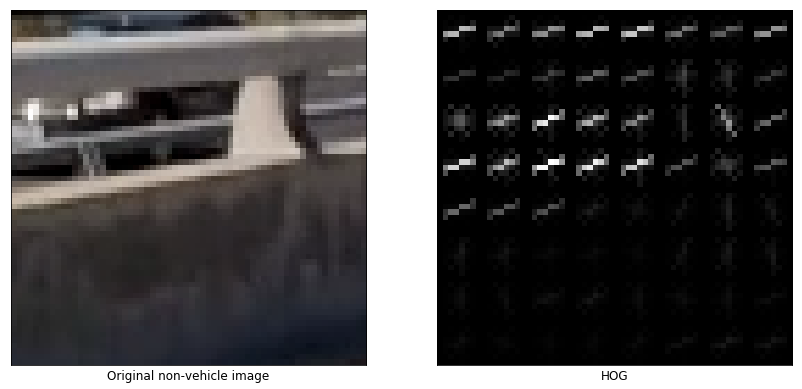

In [6]:
veh_img = cv2.cvtColor(cv2.imread(cars[np.random.randint(0, len(cars))]), cv2.COLOR_BGR2RGB)
_, veh_dst = get_hog_features(veh_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
nonveh_img = cv2.cvtColor(cv2.imread(notcars[np.random.randint(0, len(notcars))]), cv2.COLOR_BGR2RGB)
_, nonveh_dst = get_hog_features(nonveh_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)

display((veh_img, veh_dst), ("Original vehicle image", "HOG"), 14, 7, 2, "gray")
display((nonveh_img, nonveh_dst), ("Original non-vehicle image", "HOG"), 14, 7, 2, "gray")

In [7]:
def bin_spatial(img, size=(16, 16)):
    """
    Compute the binned color features of the input image.
        Parameters:
            img: Input image.
            size (Default = 16 x 16): 
    """
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

In [8]:
def color_hist(img, nbins=32):
    """
    Compute the color histogram features of the input image.
        Parameters:
            img: Input image.
            nbins (Default = 32): Number of histogram pins.
    """
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    return hist_features

In [9]:
def img_features(feature_image, spatial_feat, hist_feat, hog_feat, hist_bins, orient,
                 pix_per_cell, cell_per_block, hog_channel, color_space):
    """
    Extract the features from the input image.
        Parameters:
            feature_image: Input image (RGB).
            spatial_feat: Binned color features flag.
            hist_feat: Color histogram features flag
            hog_feat: HOG features flag.
            hist_bins: Number of histogram pins.
            orient: Number of orientation bins.
            pix_per_cell: Size (in pixels) of a cell.
            cell_per_block: Number of cells in each block.
            vis: Visualization flag.
            feature_vec: Return the data as a feature vector.
            hog_channel: Number of channels per cell.
            color_space (Default = RGB): Selected color space.
    """
    file_features = []
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        file_features.append(spatial_features)
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        file_features.append(hist_features)
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            print("img_shape:", feature_image.shape)
            for channel in range(feature_image.shape[2]):
                feature = get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True)
                hog_features.append(feature)
                hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        file_features.append(hog_features)
    return file_features

In [10]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    """
    Extract the features from the input images and ugment the dataset with flipped images.
        Parameters:
            imgs: Input images.
            color_space (Default = RGB): Selected color space.
            spatial_size (Default = (32, 32)): Spatial binning dimensions.
            hist_bins (Default = 32):  Number of histogram pins.
            orient (Default = 9): Number of orientation bins.
            pix_per_cell (Default = 8): Size (in pixels) of a cell.
            cell_per_block (Default = 2): Number of cells in each block.
            hog_channel (Default = 0): Number of channels per cell.
            spatial_feat: Binned color features flag.
            hist_feat: Color histogram features flag
            hog_feat: HOG features flag.
    """
    features = []
    for file_p in imgs:
        file_features = []
        image = cv2.imread(file_p)
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      
        file_features = img_features(feature_image, spatial_feat, hist_feat, hog_feat, hist_bins, orient, 
                        pix_per_cell, cell_per_block, hog_channel, color_space)
        features.append(np.concatenate(file_features))
        
        feature_image = cv2.flip(feature_image, 1) # Augment the dataset with flipped images
        file_features = img_features(feature_image, spatial_feat, hist_feat, hog_feat, hist_bins, orient, 
                        pix_per_cell, cell_per_block, hog_channel, color_space)
        features.append(np.concatenate(file_features))
    return features

In [11]:
# Define (sample) parameters for feature extraction, we'll test the classifier with different sets of parameters later.

color_space = 'RGB'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

In [12]:
t = time.time()
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print('Vehicle features extracted:', len(car_features), "features.")
print('Vehicle features extraction time:', round(t2 - t, 2), 'seconds.')

t = time.time()
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print('Non-Vehicle features extracted:', len(notcar_features), "features.")
print('Non-Vehicle features extraction time:', round(t2 - t, 2), 'seconds.')

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 28.64 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.64 seconds.


---
## Step 3: Classification Model

After extracting the images' features, we will now train a Linear Support Victor Clustering (LinearSVC) algorithm to classify the images to "vehicle" and "non-vehicle".

In [13]:
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)

# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets (20% for testing)
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=22)

print('Feature vector length:', len(X_train[0]))

# Use a linear SVC 
svc = LinearSVC(loss='hinge')

# Train the classifier
t = time.time()
svc.fit(X_train, y_train)
t2 = time.time()

print('Test Accuracy of SVC =', round(svc.score(X_test, y_test), 4)*100,'%')
print('SVC training time:', round(t2 - t, 2), 'seconds')

Feature vector length: 3780
Test Accuracy of SVC = 98.52 %
SVC training time: 10.86 seconds


---
## Step 4: Vehicle Detection


Now, we'll define a sliding window function `slide_window` to generate a list of boxes with predefined parameters, and a `draw_boxes` function to draw the list of boxes on an image.

In [14]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    """
    Generate a list of boxes with predefined parameters.
        Parameters:
            img: Input image.
            x_start_stop (Default = [None, None]): X-axis start/stop positions.
            y_start_stop (Default = [None, None]): Y-axis start/stop positions.
            xy_window (Default = 64 x 64): Window size.
            xy_overlap (Default = (0.5, 0.5)): Overlapping ratios.
    """
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    window_list = []
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            window_list.append(((startx, starty), (endx, endy)))
    return window_list

In [15]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    """
    Draw bounding boxes on an image.
        Parameters:
            img: Input image.
            bboxes: The bounding boxes to be drawn.
            color (Default = red): Box color.
            thick (Default = 6): Box thickness.
    """
    imcopy = np.copy(img)
    for bbox in bboxes:
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    return imcopy

In [16]:
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    """
    Extract the features of a single image.
        Parameters:
            img: Input image.
            color_space (Default = RGB): Selected color space.
            spatial_size (Default = (32, 32)): Spatial binning dimensions.
            hist_bins (Default = 32): Number of histogram pins.
            orient (Default = 9): Number of orientation bins.
            pix_per_cell (Default = 8): Size (in pixels) of a cell.
            cell_per_block (Default = 2):: Number of cells in each block.
            hog_channel (Default = 0): Number of channels per cell.
            spatial_feat (Default = True): Binned color features flag.
            hist_feat (Default = True): Color histogram features flag
            hog_feat (Default = True): HOG features flag.
        """
    img_features = []
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
        elif color_space == 'LAB':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    else: feature_image = np.copy(img)      
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        img_features.append(spatial_features)
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        img_features.append(hist_features)
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)
    return np.concatenate(img_features)

In [17]:
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, orient=8, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):
    """
    Search for positive detections in the input image.
        Parameters:
            img: Input image.
            windows: A list of windows to be searched.
            scaler: The features scaler.
            color_space (Default = RGB): Selected color space.
            spatial_size (Default = (32, 32)): Spatial binning dimensions.
            hist_bins (Default = 32): Number of histogram pins.            
            orient (Default = 9): Number of orientation bins.
            pix_per_cell (Default = 8): Size (in pixels) of a cell.
            cell_per_block (Default = 2):: Number of cells in each block.
            hog_channel (Default = 0): Number of channels per cell.
            spatial_feat (Default = True): Binned color features flag.
            hist_feat (Default = True): Color histogram features flag
            hog_feat (Default = True): HOG features flag.
        """
    on_windows = []
    for window in windows:
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        prediction = clf.predict(test_features)
        if prediction == 1:
            on_windows.append(window)
    return on_windows

### Deciding on feature extraction parameters:

Now, we need to decide which parameters we will use to extract the images' features. Our choices will hugely affect the classifier's performance, so we will test the classifier performance using different parameters combinations to find out the best paramaters to use.

In [18]:
def classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel, spatial_size,
                    hist_bins, spatial_feat, hist_feat, hog_feat):
    
    t = time.time()
    car_features = extract_features(cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    t2 = time.time()
    print('Vehicle features extracted:', len(car_features), "features.")
    print('Vehicle features extraction time:', round(t2 - t, 2), 'seconds.')
    
    t = time.time()
    notcar_features = extract_features(notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    t2 = time.time()
    print('Non-Vehicle features extracted:', len(notcar_features), "features.")
    print('Non-Vehicle features extraction time:', round(t2 - t, 2), 'seconds.')
    
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        

    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)
    
    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
    
    # Split up data into randomized training and test sets (20% for testing)
    X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size=0.2, random_state=22)
    
    print('Feature vector length:', len(X_train[0]))
    
    # Use a linear SVC 
    svc = LinearSVC(loss='hinge')
    
    # Train the classifier
    t = time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    
    print("***************************************")
    print("*     Parameter      |      Value     *")
    print("***************************************")
    print("* Color space        |", color_space, "           *")
    print("* Orientation bins   |", orient, "             *")
    print("* pix_per_cell       |", pix_per_cell, "             *")
    print("* cell_per_block     |", cell_per_block, "             *")
    print("* HOG channel        |", hog_channel, "             *")
    print("* Spatial dimensions |", spatial_size, "      *")
    print("* Histogram bins     |", hist_bins, "            *")
    print("***************************************")
    
    print('Test Accuracy of SVC =', round(svc.score(X_test, y_test), 4)*100,'%')
    print('SVC training time:', round(t2 - t, 2), 'seconds')
    
    t=time.time()

    for image_f in test_images:
        image = cv2.imread(image_f)
        windows = slide_window(image, x_start_stop=[None, None], y_start_stop=[400, 640], 
                        xy_window=(128, 128), xy_overlap=(0.85, 0.85))
        hot_windows = []
        hot_windows += (search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat))
        window_img = draw_boxes(image, hot_windows, color=(0, 0, 255), thick=6)
        display((cv2.cvtColor(image, cv2.COLOR_BGR2RGB), cv2.cvtColor(window_img, cv2.COLOR_BGR2RGB)),
                ("Original image", "Detected vehicles"), 14, 7, n=2)
        
    print('Time to process test images:', round(time.time() - t, 2), 'seconds.')
    return svc, X_scaler

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 28.24 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.01 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | RGB            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.51 %
SVC training time: 10.8 seconds


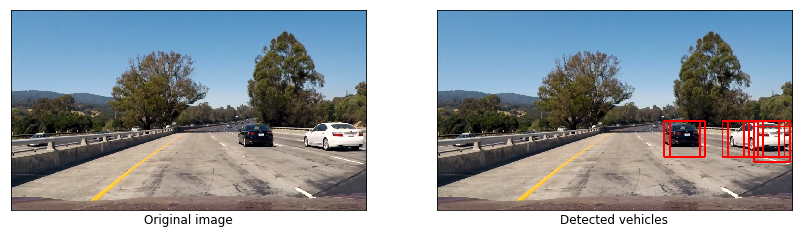

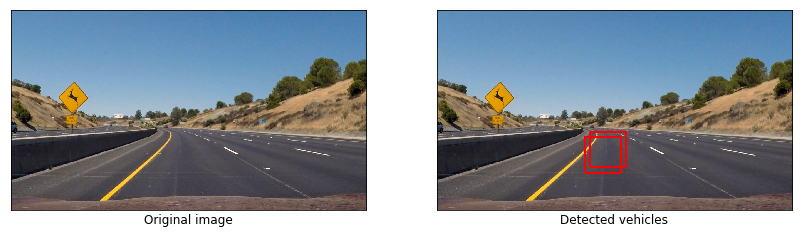

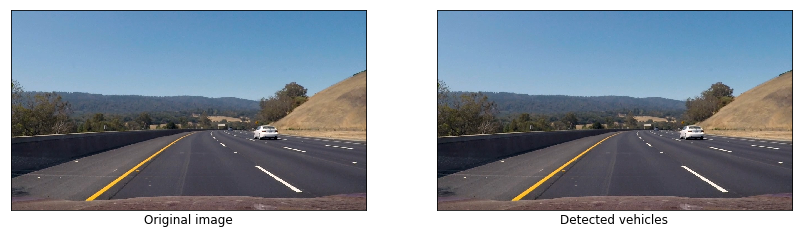

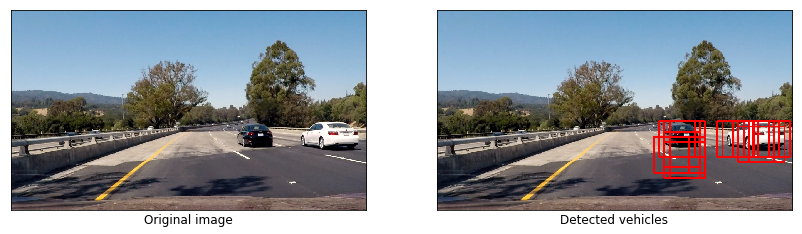

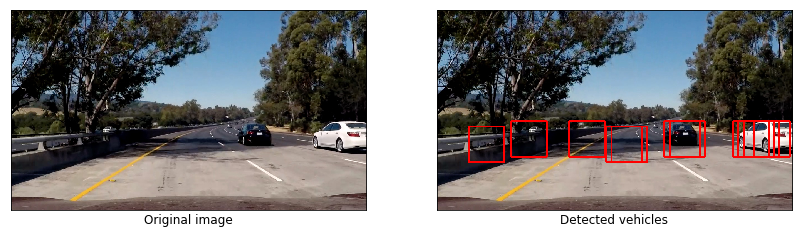

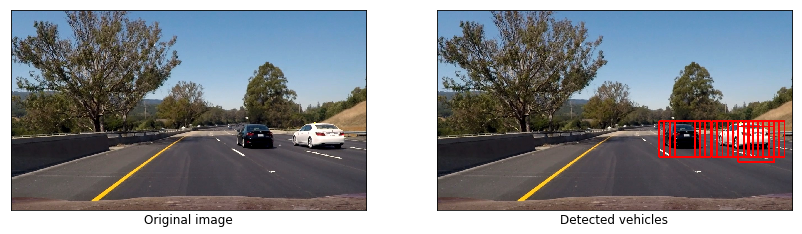

Time to process test images: 5.3 seconds.


In [19]:
color_space = 'RGB'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 29.92 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.57 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | HSV            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 96.59 %
SVC training time: 16.84 seconds


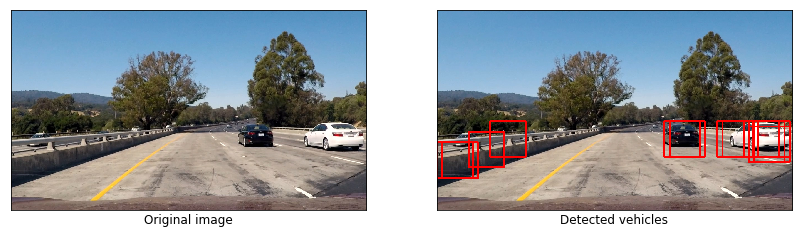

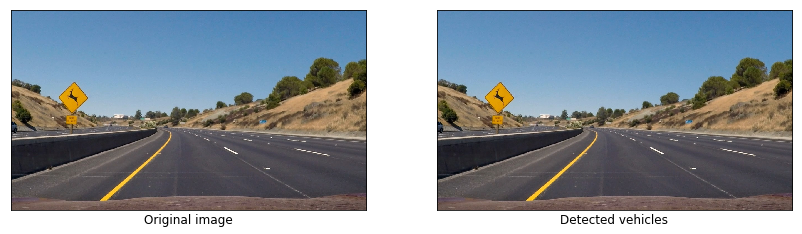

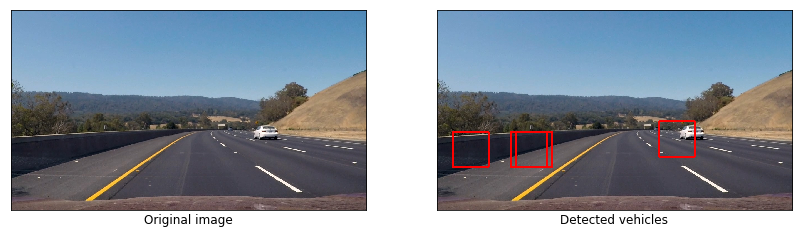

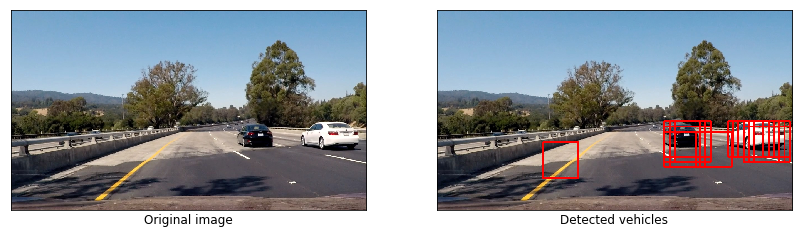

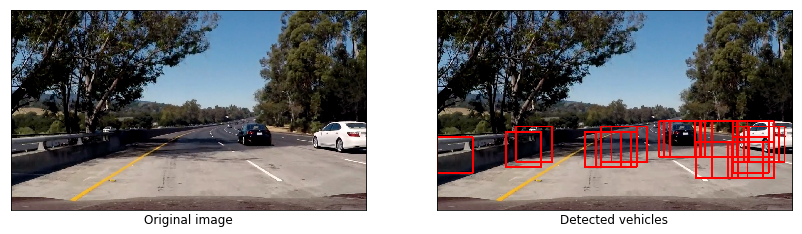

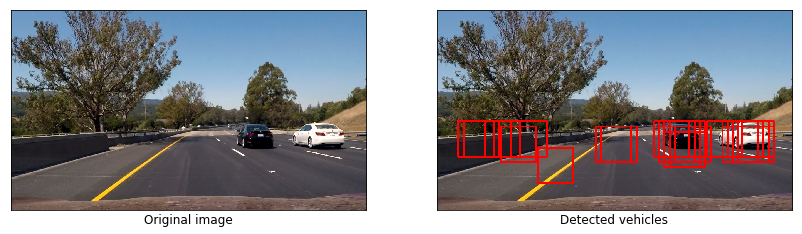

Time to process test images: 5.36 seconds.


In [20]:
color_space = 'HSV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 29.16 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 30.06 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | LUV            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.8 %
SVC training time: 9.3 seconds


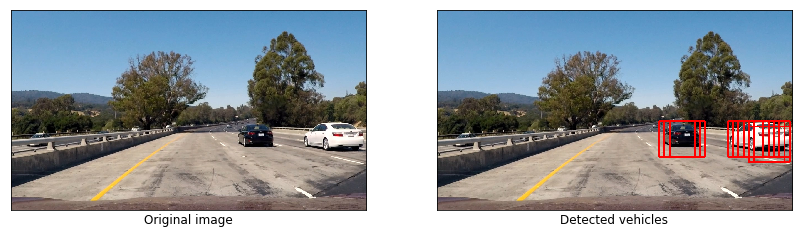

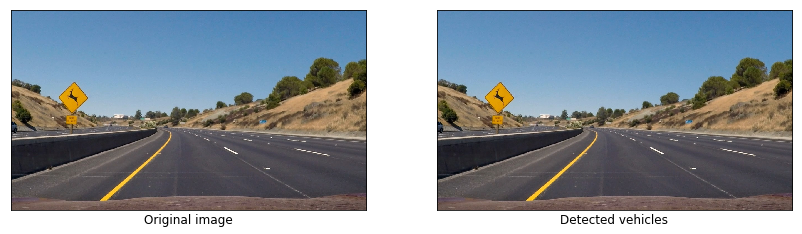

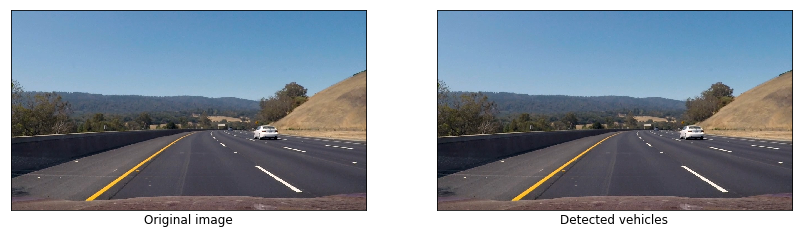

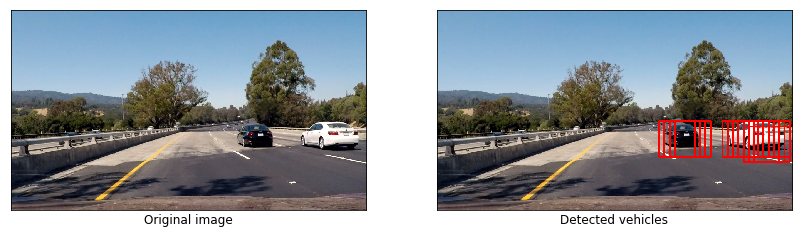

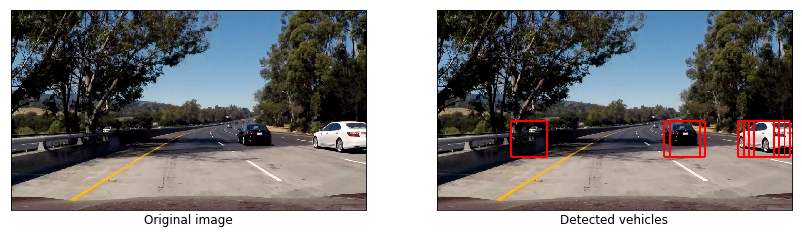

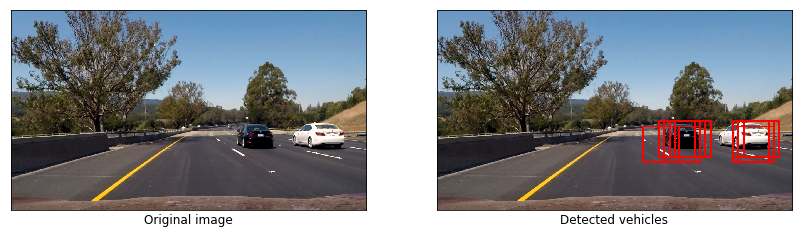

Time to process test images: 5.57 seconds.


In [21]:
color_space = 'LUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 29.28 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.59 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | HLS            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 95.83 %
SVC training time: 19.23 seconds


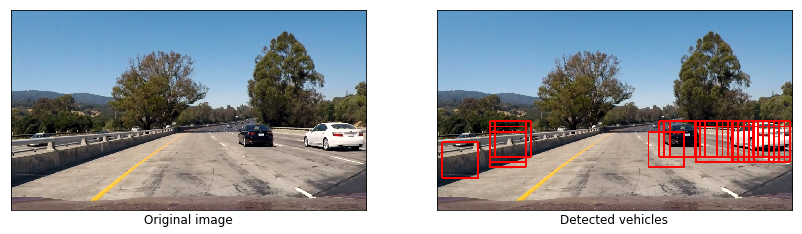

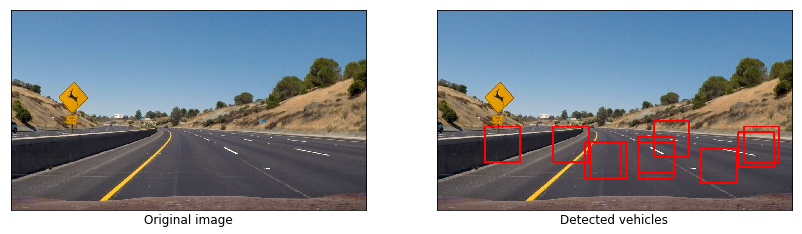

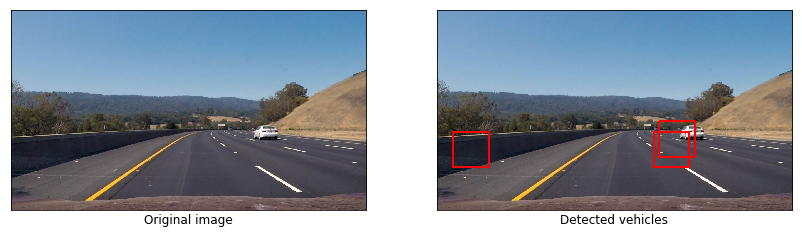

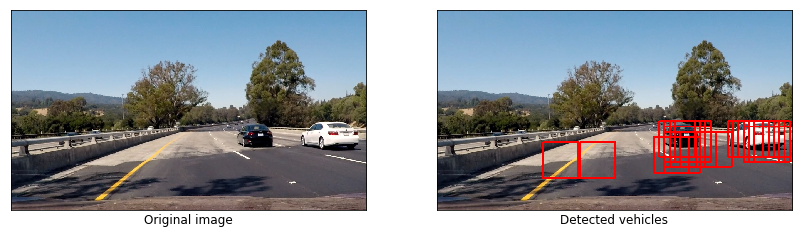

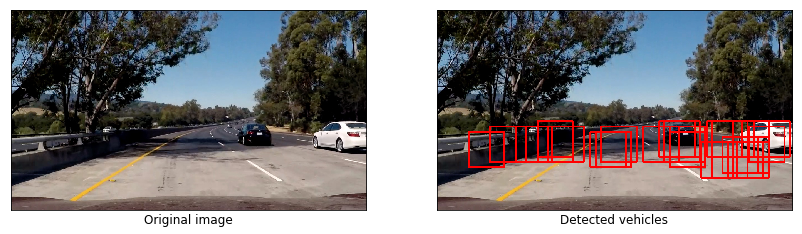

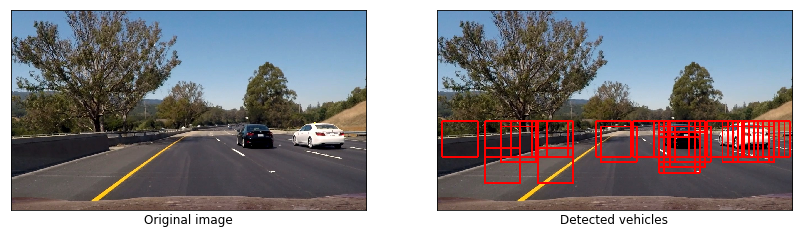

Time to process test images: 5.4 seconds.


In [22]:
color_space = 'HLS'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 28.97 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.03 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | YUV            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.8 %
SVC training time: 9.22 seconds


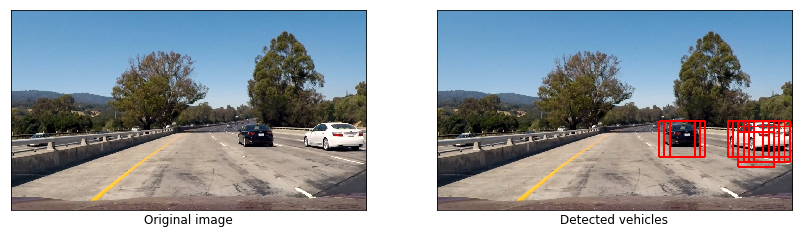

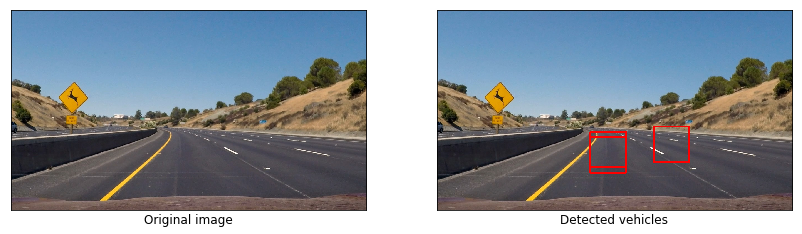

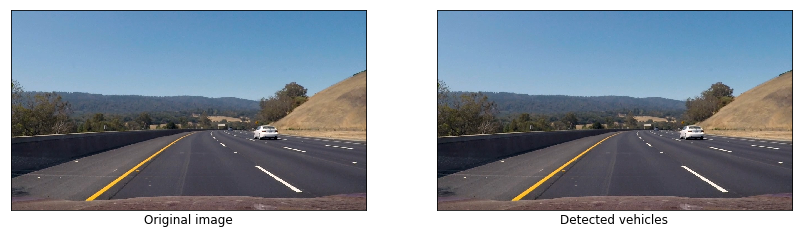

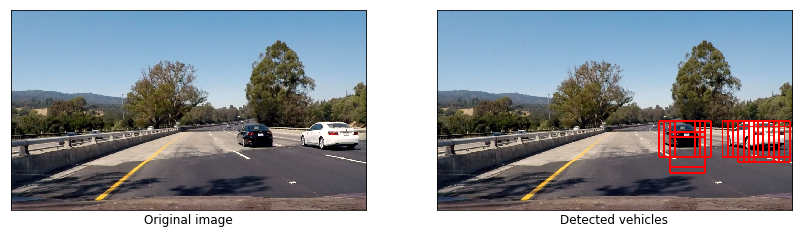

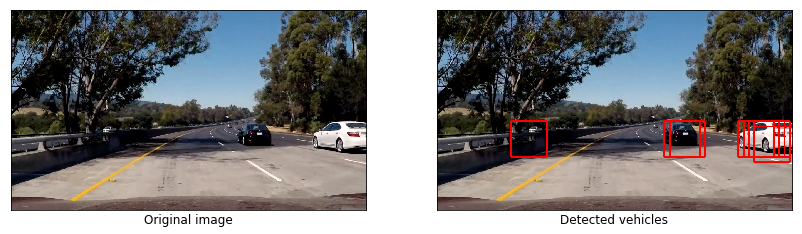

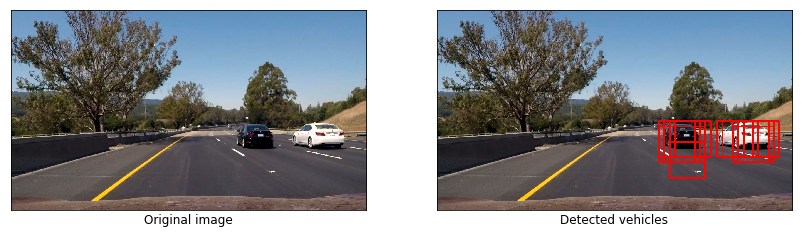

Time to process test images: 5.31 seconds.


In [23]:
color_space = 'YUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 28.67 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 29.05 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | YCrCb            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.93 %
SVC training time: 9.14 seconds


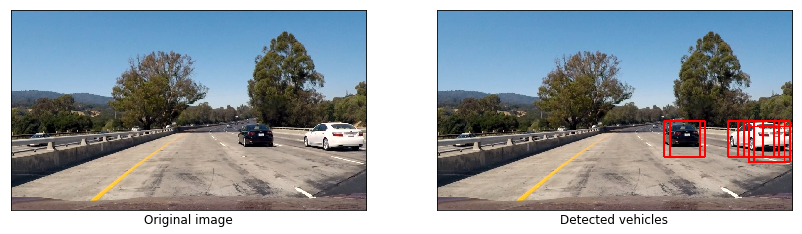

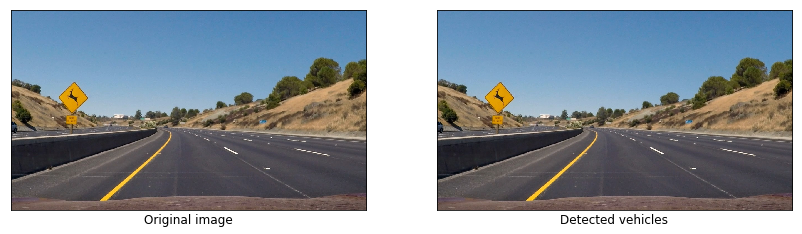

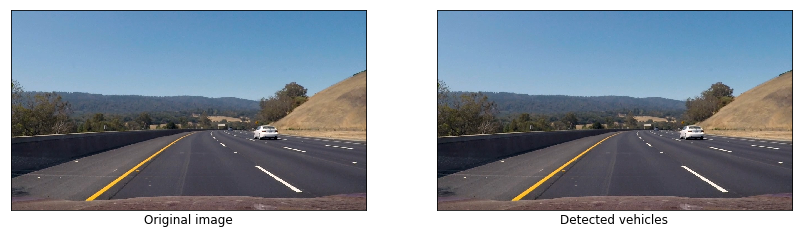

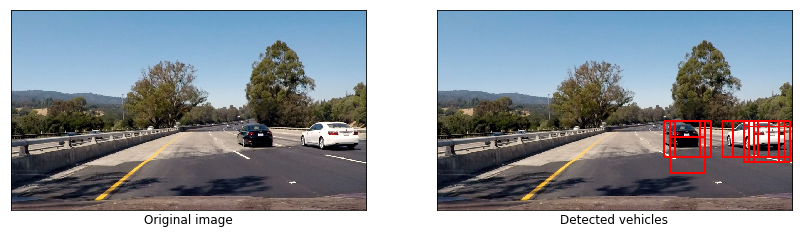

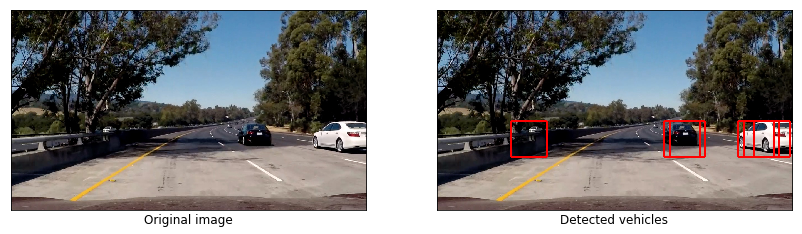

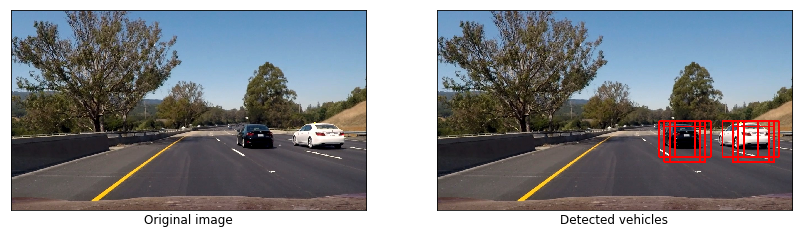

Time to process test images: 5.32 seconds.


In [24]:
color_space = 'YCrCb'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

As we can observe, using the LUV color space is produces fairly good performance, with 98.8% test accuracy. We'll now try to change the other parameters (Which are set to the default values) and try to get better performance, using the same LUV color space.

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 30.77 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 31.71 seconds.
Feature vector length: 2432
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | LUV            *
* Orientation bins   | 8              *
* pix_per_cell       | 8              *
* cell_per_block     | 2              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.51 %
SVC training time: 6.06 seconds


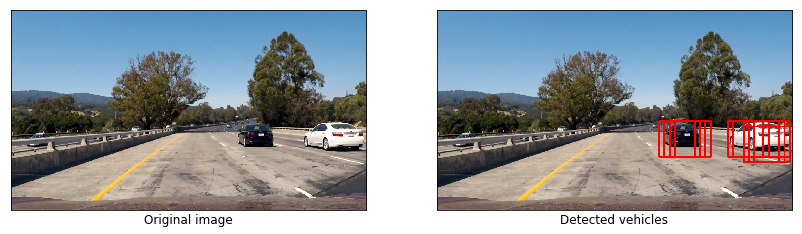

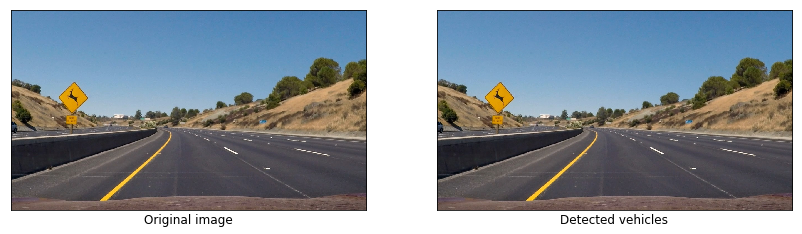

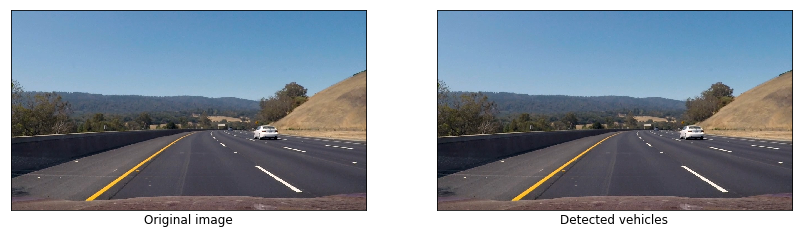

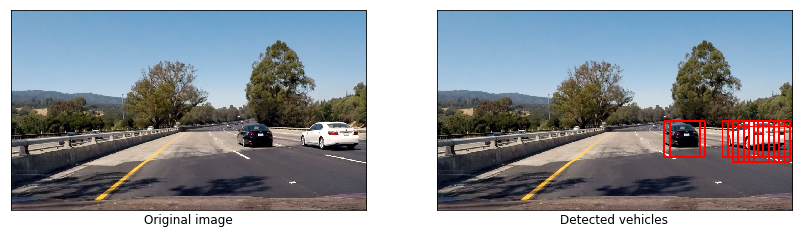

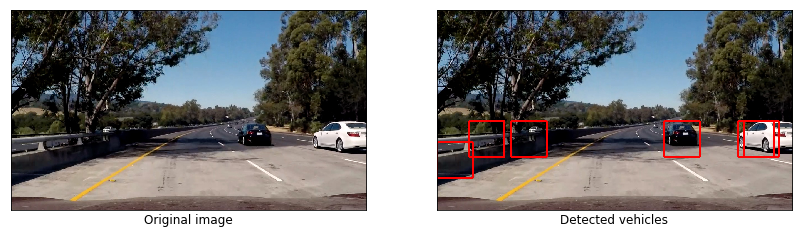

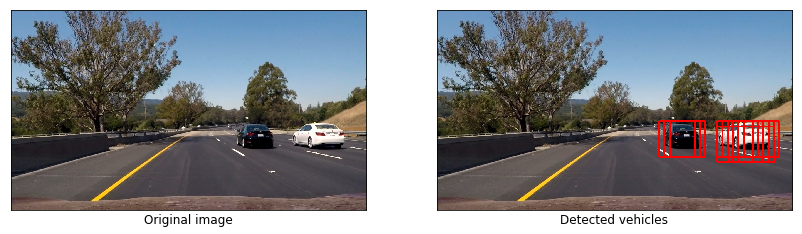

Time to process test images: 5.75 seconds.


In [32]:
color_space = 'LUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 8                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 2          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 25.26 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 26.16 seconds.
Feature vector length: 1260
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | LUV            *
* Orientation bins   | 11              *
* pix_per_cell       | 16              *
* cell_per_block     | 2              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.52 %
SVC training time: 2.69 seconds


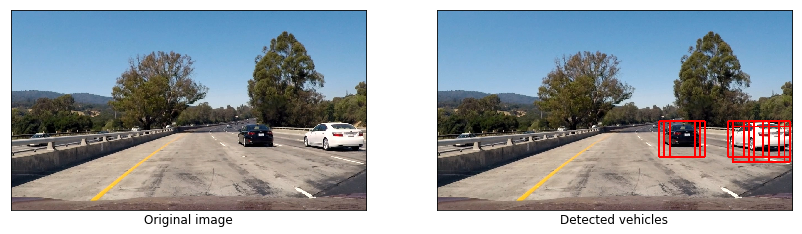

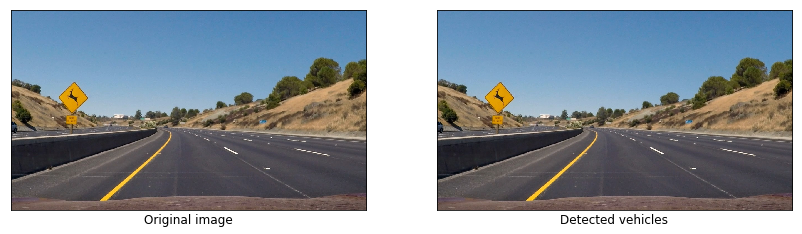

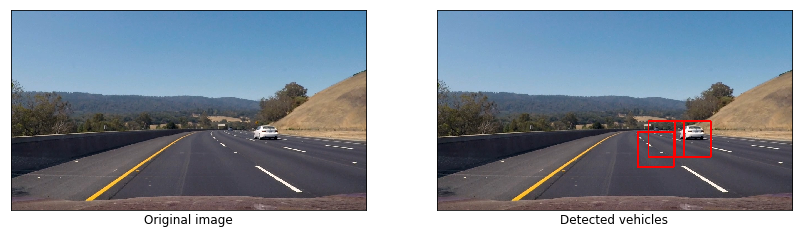

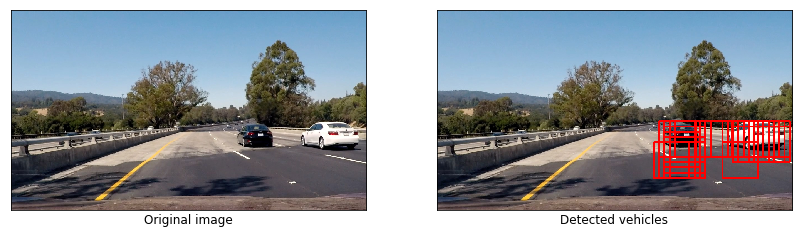

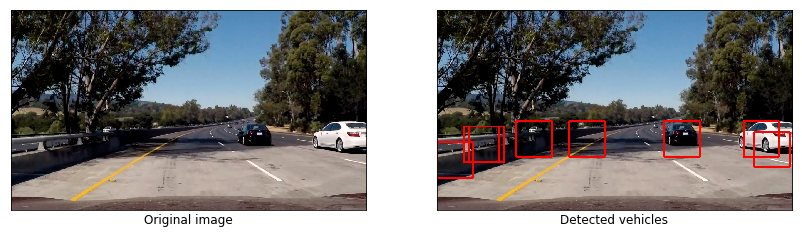

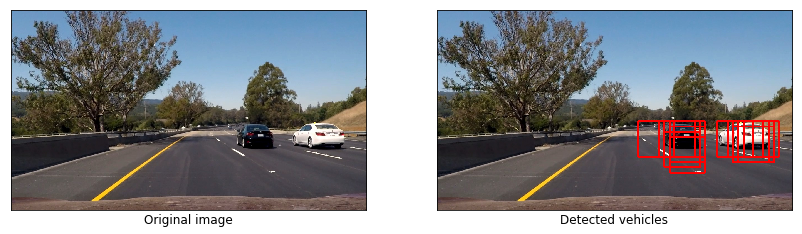

Time to process test images: 5.07 seconds.


In [33]:
color_space = 'LUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11                 # HOG orientations
pix_per_cell = 16           # HOG pixels per cell
cell_per_block = 2          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 24.14 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 24.96 seconds.
Feature vector length: 1504
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | LUV            *
* Orientation bins   | 10              *
* pix_per_cell       | 12              *
* cell_per_block     | 4              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 97.86 %
SVC training time: 4.22 seconds


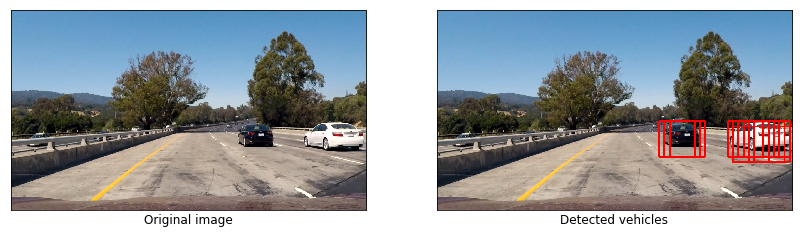

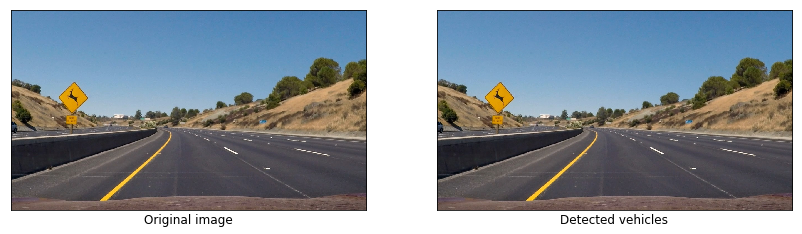

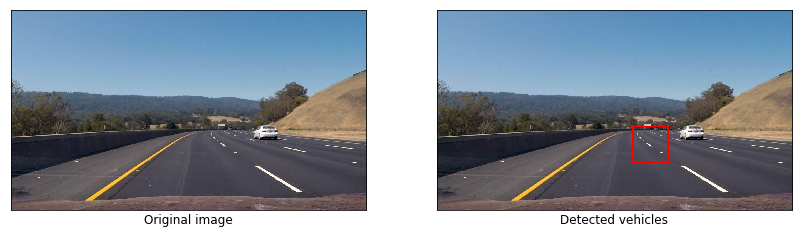

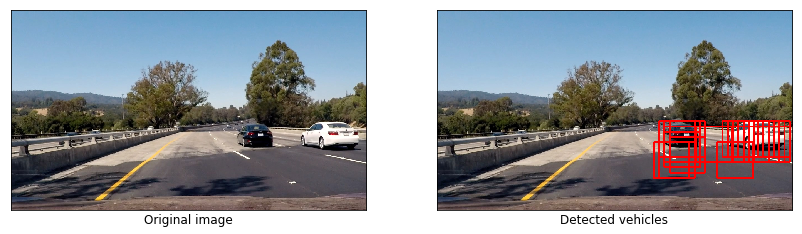

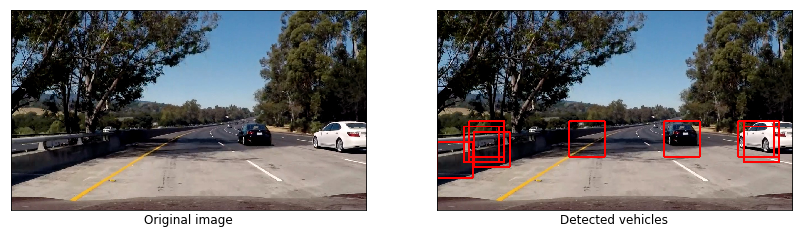

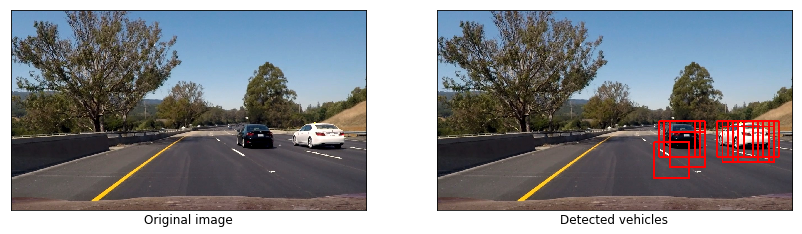

Time to process test images: 4.95 seconds.


In [34]:
color_space = 'LUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 10                 # HOG orientations
pix_per_cell = 12           # HOG pixels per cell
cell_per_block = 4          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

_ = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

As we can see on examples above, the following parameter set gave the best results:

| Parameter              | Value   |
| :--------------------: | :-----: |
| color_space            | LUV     |
| Orientation bins       | 9       |
| Pixels per cell        | 8       |
| Cells per block        | 3       |
| HOG channel            | 0       |
| Spatial dimensions     | 16 x 16 |
| Histogram bins         | 32      |

Vehicle features extracted: 17584 features.
Vehicle features extraction time: 29.19 seconds.
Non-Vehicle features extracted: 17936 features.
Non-Vehicle features extraction time: 30.04 seconds.
Feature vector length: 3780
***************************************
*     Parameter      |      Value     *
***************************************
* Color space        | LUV            *
* Orientation bins   | 9              *
* pix_per_cell       | 8              *
* cell_per_block     | 3              *
* HOG channel        | 0              *
* Spatial dimensions | (16, 16)       *
* Histogram bins     | 32             *
***************************************
Test Accuracy of SVC = 98.82 %
SVC training time: 9.35 seconds


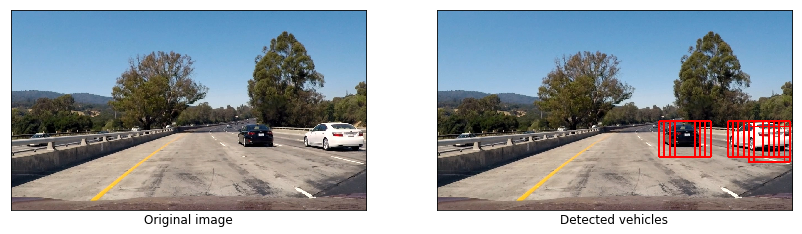

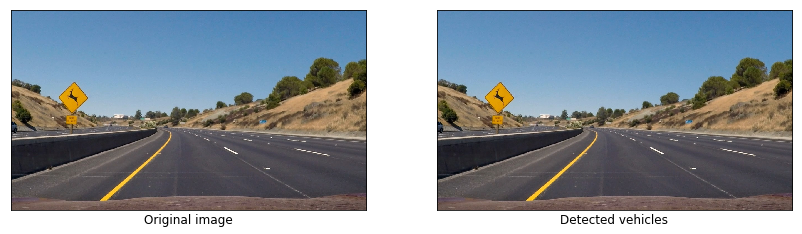

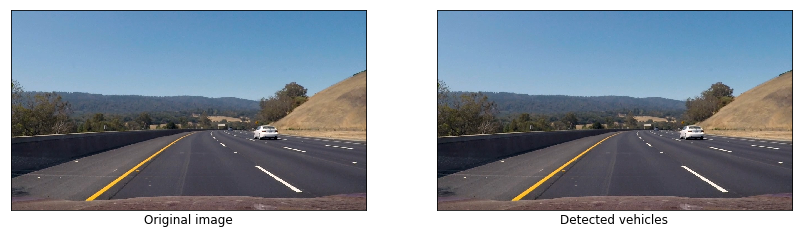

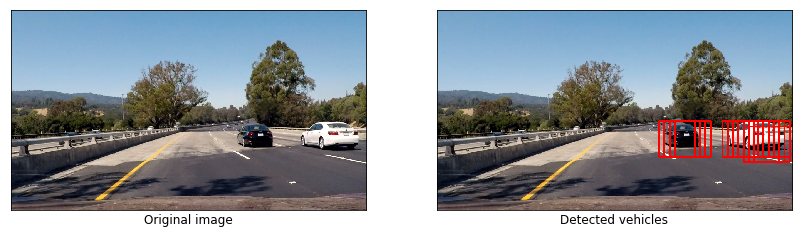

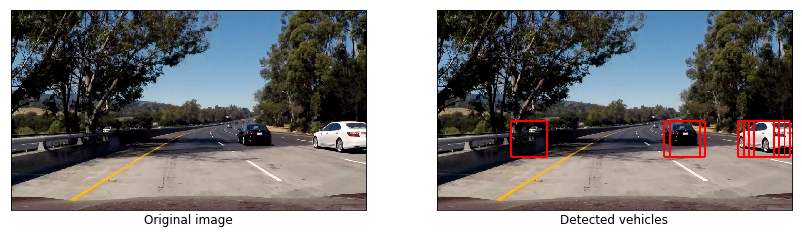

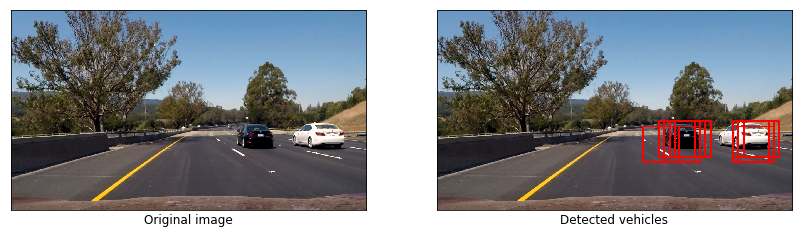

Time to process test images: 5.54 seconds.


In [41]:
color_space = 'LUV'         # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9                  # HOG orientations
pix_per_cell = 8            # HOG pixels per cell
cell_per_block = 3          # HOG cells per block
hog_channel = 0             # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16)     # Spatial binning dimensions
hist_bins = 32              # Number of histogram bins
spatial_feat = True         # Spatial features flag
hist_feat = True            # Histogram features flag
hog_feat = True             # HOG features flag

classifier, X_scaler = classifier_generator(color_space, orient, pix_per_cell, cell_per_block, hog_channel,
                         spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat)

As we can see on examples above, the classifier successfully finds cars on the test images. But the classifier failed to find a car on th 3rd image because it is too far to be detected. We will need to use multi scale windows to detect far away vehicles.

We will also need to apply a kind of filter (such as heat map) to avoid false positives (5th image) in video processing.

---
## Step 5: Advanced Vehicle Detection

### Show All Potential Search Areas

Becuase the size and position of cars in the image will be different depending on their distance from the camera, We will have to call `slide_window` a few times with different start/stop values. We will not scan with across the whole image, but only across areas where a new car can appear, and areas where a car was detected.

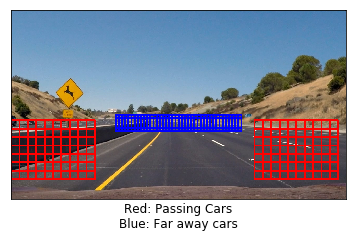

In [35]:
image = cv2.imread(test_images[1])
windows = slide_window(image, x_start_stop=[930, None], y_start_stop=[420, 650], 
                    xy_window=(128, 128), xy_overlap=(0.75, 0.75))
windows += slide_window(image, x_start_stop=[0, 350], y_start_stop=[420, 650], 
                    xy_window=(128, 128), xy_overlap=(0.75, 0.75))
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6) 
windows = slide_window(image, x_start_stop=[400, 880], y_start_stop=[400, 470], 
                    xy_window=(48, 48), xy_overlap=(0.75, 0.75))
window_img = draw_boxes(window_img, windows, color=(255, 0, 0), thick=6)                     
display(cv2.cvtColor(window_img, cv2.COLOR_BGR2RGB), 'Red: Passing Cars''\n''Blue: Far away cars')

### Refine detected car position

For every detected car we are doing to scan with a sliding window the ROI around the previous known position. We use multiple scales of windows in order to detect the car and its position more accurate and reliable.

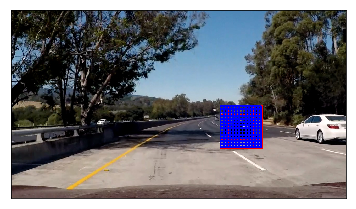

In [36]:
image = cv2.imread(test_images[4])
track = (880, 450)
w_size = 80
windows = slide_window(image, x_start_stop=[track[0]-w_size,track[0]+w_size], 
                       y_start_stop=[track[1]-w_size,track[1]+w_size], 
                       xy_window=(128, 128), xy_overlap=(0.75, 0.75))
window_img = draw_boxes(image, windows, color=(0, 0, 255), thick=6)
windows = slide_window(image, x_start_stop=[track[0]-w_size,track[0]+w_size], 
                       y_start_stop=[track[1]-int(w_size),track[1]+int(w_size)], 
                       xy_window=(48, 48), xy_overlap=(0.75, 0.75))
window_img = draw_boxes(window_img, windows, color=(255, 0, 0), thick=6)                    
display(cv2.cvtColor(window_img, cv2.COLOR_BGR2RGB), '')

The following function `find_cars` finds windows with a car in a given range with windows of a given scale.

In [52]:
def find_cars(img, ystart, ystop, xstart, xstop, scale, step, cspace):
    """
    Find windows with a car in a given range.
        Parameters:
            img: List of images to be displayed.
            ystart, ystop, xstart, xstop: Range to work with.
            x, y (Default = 14 x 7): Figure size.
            scale: Window scale.
            step: Wondow step.
            cspace: The selected color space.
    """
    boxes = []
    draw_img = np.zeros_like(img)   
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)   
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))       
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = window // pix_per_cell - cell_per_block + 1
    cells_per_step = step  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_features = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            # Extract the image patch
            subimg = ctrans_tosearch[ytop:ytop+window, xleft:xleft+window]
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))        
            test_prediction = classifier.predict(test_features)
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)+xstart
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                boxes.append(((int(xbox_left), int(ytop_draw+ystart)),(int(xbox_left+win_draw),int(ytop_draw+win_draw+ystart))))
    return boxes

### Lane Finding function

Here, we'll use `lane_detector` function from the [Advanced Lane Finding](https://github.com/mohamedameen93/Advanced-Lane-Finding-Using-OpenCV) project to detect lanes.

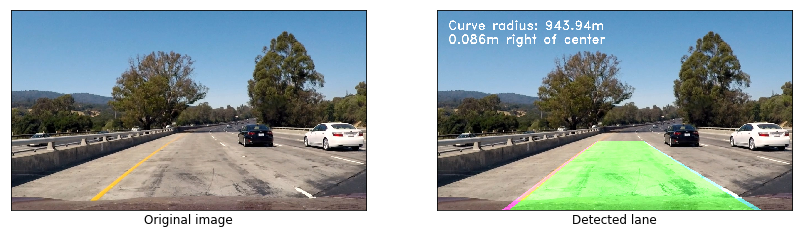

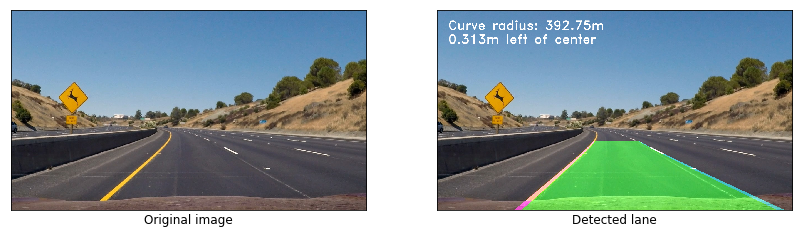

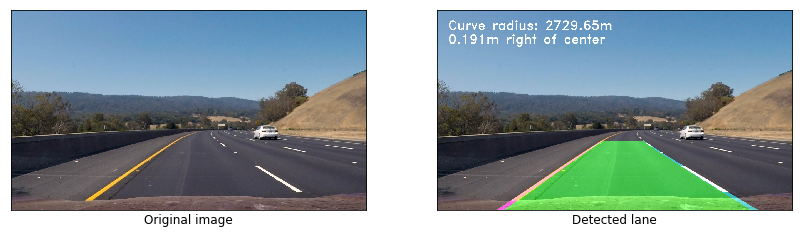

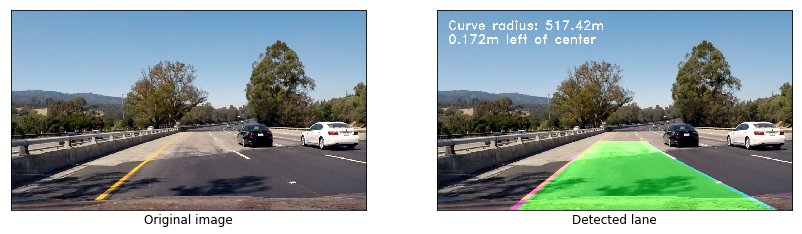

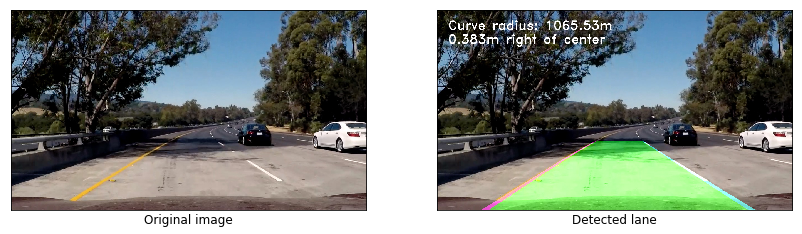

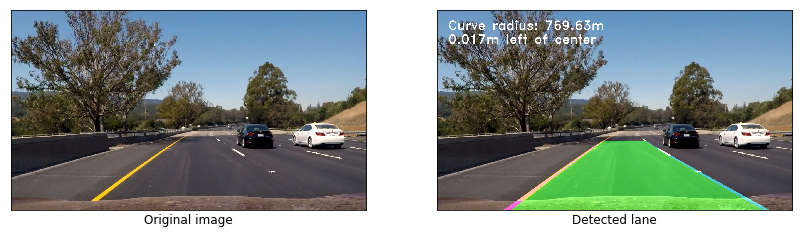

In [48]:
from LaneFinding import frame_processor as lane_detector

for image_f in test_images:
    image = cv2.cvtColor(cv2.imread(image_f), cv2.COLOR_BGR2RGB)
    display((image, lane_detector(image)), ['Original image', 'Detected lane'], n=2)

---
## Step 6: Video Processing

Now, we'll build a pipeline to process the video frames. We'll filter the found windows by a heatmap approach in order to combine overlapping detections, and we will apply threshold to remove false positives.

In order to reduce jitter, a function called `low_filter` applies a simple low-pass filter on the new and the previous cars boxes coordinates and sizes.

### Multiple Detections & False Positives

We'll filter the found windows by a heatmap approach in order to combine overlapping detections, and we will apply threshold to remove false positives.

In [53]:
def add_heat(heatmap, bbox_list):
    """
    Filter the found windows to combine overlapping detection.
        Parameters:
            heatmap: A zero-like NumPy array with the size of the image.
            bbox_list: A list of bounding boxes.
    """
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    return heatmap

def apply_threshold(heatmap, threshold):
    """
    Apply threshold to the heatmap to remove false positives.
        Parameters:
            heatmap: Input heatmap.
            threshold: Selected threshold.
    """
    heatmap[heatmap < threshold] = 0 
    return heatmap 

### Jitter Reduction

In order to reduce jitter (Smooth the car boxes), a function called `low_filter` applies a simple low-pass filter on the new and the previous cars boxes coordinates and sizes.

In [54]:
def low_filter(a, b, alpha):
    """
    Applies a simple low-pass filter.
        Parameters:
            a, b: Input coordinates and sizes.
            alpha: 
    """
    return a*alpha+(1.0-alpha)*b

In [55]:
# Supportive functions

def len_points(p1, p2):
    """
    Calculate the distance between two points.
        Parameters:
            p1, p2: The input points
    """
    return np.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

def track_to_box(p):
    """
    Create box coordinates out of its center and span.
        Parameters:
            p: Input track.
    """
    return ((int(p[0]-p[2]),int(p[1]-p[3])),(int(p[0]+p[2]), int(p[1]+p[3])))

In [39]:
from scipy.ndimage.measurements import label

THRES = 3 
ALPHA = 0.75
track_list = []
THRES_LEN = 32
Y_MIN = 440

heat_p = np.zeros((720, 1280))
boxes_p = []
n_count = 0

In [56]:
def draw_labeled_bboxes(labels):
    """
    Generate boxes related to found cars in the frame.
        Parameters:
            labels: Input labels (Found cars).
    """
    global track_list
    track_list_l = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        #img = draw_boxes(np.copy(img), [bbox], color=(255,0,255), thick=3)
        size_x = (bbox[1][0]-bbox[0][0])/2.0 #Size of the found box
        size_y = (bbox[1][1]-bbox[0][1])/2.0
        asp_d = size_x / size_y
        size_m = (size_x + size_y)/2
        x = size_x+bbox[0][0]
        y = size_y+bbox[0][1]
        asp = (y-Y_MIN)/130.0+1.2 # Best rectangle aspect ratio for the box (coefficients from perspectieve measurements and experiments)
        if x>1050 or x<230:
            asp*=1.4
        asp = max(asp, asp_d) # for several cars chunk
        size_ya = np.sqrt(size_x*size_y/asp)
        size_xa = int(size_ya*asp)
        size_ya = int(size_ya)
        if x > (-3.049*y+1809): #If the rectangle on the road, coordinates estimated from a test image
            track_list_l.append(np.array([x, y, size_xa, size_ya]))
            if len(track_list) > 0:
                track_l = track_list_l[-1]
                dist = []
                for track in track_list:
                    dist.append(len_points(track, track_l))
                min_d = min(dist)
                if min_d < THRES_LEN:
                    ind = dist.index(min_d)
                    track_list_l[-1] = low_filter(track_list[ind], track_list_l[-1], ALPHA)
    track_list = track_list_l
    boxes = []
    for track in track_list_l:
        boxes.append(track_to_box(track))
    return boxes

In [57]:
def frame_processor(img, color_space):
    """
    Detects and vehicles in input image.
        Parameters:
            img: Input image.
            color_space: The color space used by the classifier.
    """
    global heat_p, boxes_p, n_count
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    boxes = []
    boxes = find_cars(img, 400, 650, 950, 1280, 2.0, 2, color_space)
    boxes += find_cars(img, 400, 500, 950, 1280, 1.5, 2, color_space)
    boxes += find_cars(img, 400, 650, 0, 330, 2.0, 2, color_space)
    boxes += find_cars(img, 400, 500, 0, 330, 1.5, 2, color_space)
    boxes += find_cars(img, 400, 460, 330, 950, 0.75, 3, color_space)
    for track in track_list:
        y_loc = track[1]+track[3]
        lane_w = (y_loc*2.841-1170.0)/3.0
        if lane_w < 96:
            lane_w = 96
        lane_h = lane_w/1.2
        lane_w = max(lane_w, track[2])
        xs = track[0]-lane_w
        xf = track[0]+lane_w
        if track[1] < Y_MIN:
            track[1] = Y_MIN
        ys = track[1]-lane_h
        yf = track[1]+lane_h
        if xs < 0: xs=0
        if xf > 1280: xf=1280
        if ys < Y_MIN - 40: ys=Y_MIN - 40
        if yf > 720: yf=720
        size_sq = lane_w / (0.015*lane_w+0.3)
        scale = size_sq / 64.0
        # Apply multi scale image windows 
        boxes+=find_cars(img, int(ys), int(yf), int(xs), int(xf), scale, 2, color_space)
        boxes+=find_cars(img, int(ys), int(yf), int(xs), int(xf), scale*1.25, 2, color_space)
        boxes+=find_cars(img, int(ys), int(yf), int(xs), int(xf), scale*1.5, 2, color_space)
        boxes+=find_cars(img, int(ys), int(yf), int(xs), int(xf), scale*1.75, 2, color_space)
    heat = add_heat(heat, boxes)
    heat_l = heat_p + heat
    heat_p = heat
    heat_l = apply_threshold(heat_l, THRES)
    heatmap = np.clip(heat_l, 0, 255)
    labels = label(heatmap)
    cars_boxes = draw_labeled_bboxes(labels)
    boxes_p = cars_boxes 
    imp = draw_boxes(np.copy(img), cars_boxes, color=(0, 0, 255), thick=6)
    n_count += 1
    return imp

Now, we'll use the above functions to detect vehicles in a video stream.

In [50]:
from moviepy.editor import VideoFileClip
n_count = 0

def process_image(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    output = cv2.cvtColor(frame_processor(image, color_space), cv2.COLOR_BGR2RGB)
    return lane_detector(output)

output_v = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
clip = clip1.fl_image(process_image)
%time clip.write_videofile(output_v, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:36<00:00,  4.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 9min 13s, sys: 1.68 s, total: 9min 14s
Wall time: 5min 37s


---
## Conclusion

- The pipeline was able to correctly label vehicles in the project video.


- The algorithm may diffenately fail in case of difficult light conditions, which could be partly resolved by using a more robust classifier, like the Yolo model for example.


- It is possible to improve the classifier by additional data augmentation, and further parameter tuning.


- The algorithm may have difficulties in classifying overlapping vehicles. To resolve this problem, we may introduce long term memory of the vehicle's position and a kind of predictive algorithm which can predict where occluded vehicle can be.


- To eliminate false positives on areas out of the road, we can integrate the results from the [Lane Finding project](https://github.com/mohamedameen93/Advanced-Lane-Finding-Using-OpenCV) to correctly determine the wide ROI on the whole frame by the road boundaries.